In [33]:
from pathlib import Path
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io import loadmat
from oasis.functions import gen_data, gen_sinusoidal_data, deconvolve, estimate_parameters
from oasis.plotting import simpleaxis
from oasis.oasis_methods import oasisAR1, oasisAR2

EXTRACT_dir = "/Volumes/ASA_Lab/Users/May/EXTRACT"

session_name = "20260502_C5711C"



In [12]:

session_dir = Path(EXTRACT_dir) / session_name
traces_dir = session_dir / f"{session_name}_precomputed_output.mat"
labels_dir = session_dir / f"{session_name}_precomputed_output_LABELS.mat"

with h5py.File(traces_dir, "r") as f:
    traces = np.array(f["precomputedOutput"]["traces"])

label_mat = loadmat(labels_dir)

labels = label_mat["labels"][0, 0]["labels_overall"].squeeze()

# Ensure traces is time x components
if traces.shape[0] == labels.shape[0]:
    traces = traces.T

assert traces.shape[1] == labels.shape[0], (
    f"Mismatch: traces shape {traces.shape}, labels shape {labels.shape}"
)

cell_mask = labels == 1
not_cell_mask = labels == -1

cell_traces = traces[:, cell_mask]
not_cell_traces = traces[:, not_cell_mask]

cell_idx = np.where(cell_mask)[0]

cell_trace_df = pd.DataFrame(
    cell_traces,
    columns=[f"cell_{i}" for i in cell_idx]
)

print("all traces:", traces.shape)
print("labels:", labels.shape)
print("num cells:", cell_mask.sum())
print("num not cells:", not_cell_mask.sum())
print("cell traces:", cell_traces.shape)
print("not-cell traces:", not_cell_traces.shape)

all traces: (34831, 229)
labels: (229,)
num cells: 136
num not cells: 93
cell traces: (34831, 136)
not-cell traces: (34831, 93)


In [52]:
import numpy as np
import pandas as pd
from oasis.functions import deconvolve

fps = 30
tau_seconds = 1.0
g = np.exp(-1 / (fps * tau_seconds))

out = {}
deconvolved_traces ={}
successful_cells = []
failed_cells = []

for col in cell_trace_df.columns:
    try:
        trace = cell_trace_df[col].to_numpy(dtype=float).squeeze()

        if trace.ndim != 1:
            raise ValueError(f"{col} is not 1D: {trace.shape}")

        trace = (
            pd.Series(trace)
            .interpolate(limit_direction="both")
            .to_numpy(dtype=float)
        )

        if not np.isfinite(trace).all():
            raise ValueError("non-finite values remain after interpolation")

        if np.std(trace) == 0:
            raise ValueError("flat trace")

        y = trace - np.percentile(trace, 10)
        y = np.ascontiguousarray(y.ravel(), dtype=np.float64)

        dy = np.diff(y)
        sn = np.median(np.abs(dy - np.median(dy))) / 0.6745 / np.sqrt(2)

        if not np.isfinite(sn) or sn <= 0:
            raise ValueError(f"bad noise estimate sn={sn}")

        c, s, b, g_out, lam = deconvolve(
            y,
            g=(g,),
            sn=sn,
            penalty=1,
            optimize_g=0,
        )

        out[f"{col}_calcium"] = c
        out[f"{col}_deconv"] = s
        out[f"{col}_baseline"] = b
        
        deconvolved_traces[col] = out[f"{col}_deconv"]
        
        successful_cells.append(col)


    except Exception as e:
        failed_cells.append((col, repr(e)))
        
        

denoised_df = pd.DataFrame(out, index=cell_trace_df.index)
deconvolved_traces_df = pd.DataFrame(deconvolved_traces, index=cell_trace_df.index)

print("successful:", len(successful_cells), "of", len(cell_trace_df.columns))
print("failed:", len(failed_cells), "of", len(cell_trace_df.columns))
print(failed_cells[:10])

successful: 135 of 136
failed: 1 of 136
[('cell_115', "ValueError('bad noise estimate sn=0.0')")]


In [48]:
denoised_df.shape

(34831, 405)

In [49]:
denoised_df 

,cell_0_calcium,cell_0_deconv,cell_0_baseline,cell_1_calcium,cell_1_deconv,cell_1_baseline,cell_2_calcium,cell_2_deconv,cell_2_baseline,cell_3_calcium,...,cell_222_baseline,cell_223_calcium,cell_223_deconv,cell_223_baseline,cell_224_calcium,cell_224_deconv,cell_224_baseline,cell_225_calcium,cell_225_deconv,cell_225_baseline
0,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.000000e+00,0.0,0.007372,0.000000e+00,0.0,0.003135,0.000000,0.0
1,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.000000e+00,0.0,0.007131,0.000000e+00,0.0,0.003032,0.000000,0.0
2,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000910,9.102517e-04,0.0,0.006897,0.000000e+00,0.0,0.002933,0.000000,0.0
3,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000880,0.000000e+00,0.0,0.006671,0.000000e+00,0.0,0.002837,0.000000,0.0
4,0.000000,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000852,0.000000e+00,0.0,0.006452,0.000000e+00,0.0,0.002744,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34826,0.007233,8.673617e-19,0.0,4.436525e-07,5.293956e-23,0.0,0.002351,0.0,0.0,0.003741,...,0.0,0.003670,-4.336809e-19,0.0,0.020597,-3.469447e-18,0.0,0.002481,0.000000,0.0
34827,0.006995,0.000000e+00,0.0,4.291078e-07,0.000000e+00,0.0,0.002274,0.0,0.0,0.003618,...,0.0,0.003550,4.336809e-19,0.0,0.019921,3.469447e-18,0.0,0.002400,0.000000,0.0
34828,0.006766,0.000000e+00,0.0,4.150400e-07,1.058791e-22,0.0,0.002200,0.0,0.0,0.003500,...,0.0,0.003434,0.000000e+00,0.0,0.019268,-3.469447e-18,0.0,0.002425,0.000104,0.0
34829,0.006544,0.000000e+00,0.0,4.014333e-07,5.293956e-23,0.0,0.002127,0.0,0.0,0.003385,...,0.0,0.003321,-4.336809e-19,0.0,0.018637,0.000000e+00,0.0,0.002345,0.000000,0.0


In [59]:
def plot_trace():
    plt.figure(figsize=(20,4))
    plt.subplot(211)
    plt.plot(b+c, lw=2, label='denoised')
    plt.plot(y, label='data', zorder=-12, c='y')
    plt.legend(ncol=3, frameon=False, loc=(.02,.85))
    simpleaxis(plt.gca())
    plt.subplot(212)
    plt.plot(s, lw=2, label='deconvolved', c='g')
    plt.ylim(0,0.15)
    plt.legend(ncol=3, frameon=False, loc=(.02,.85));
    simpleaxis(plt.gca())
   

/var/folders/k4/zr04khhn74zcj29mf4f0v8hc0000gn/T/ipykernel_34871/242007932.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20,4))


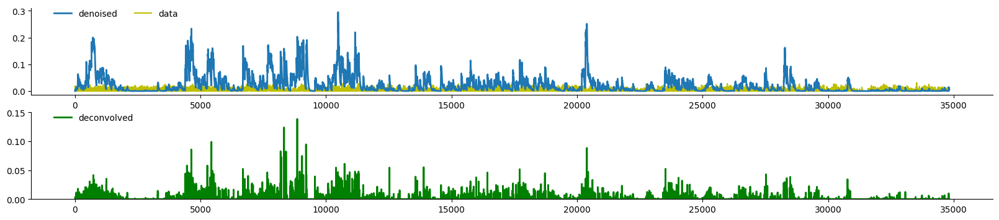

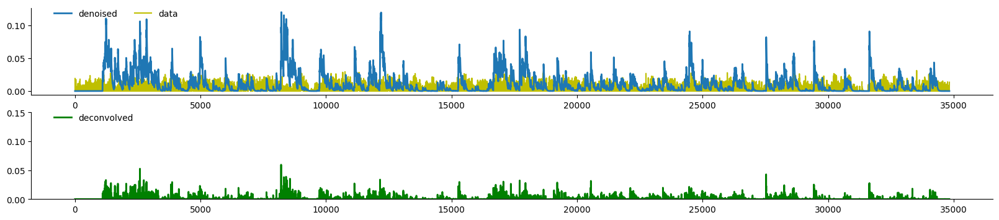

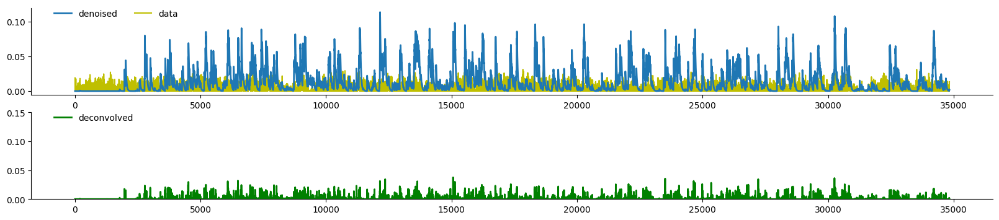

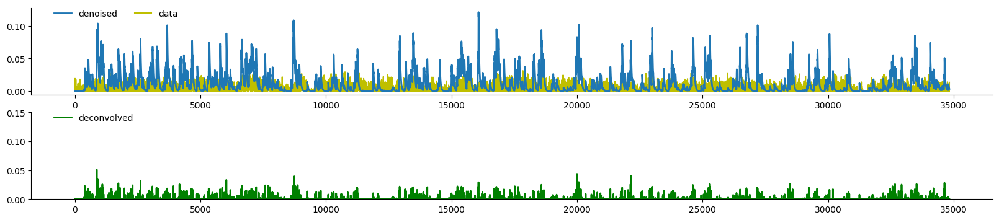

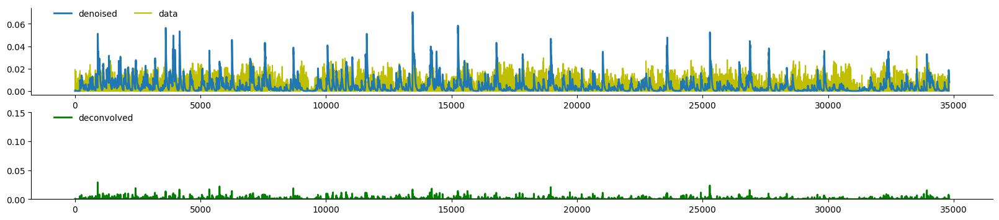

...

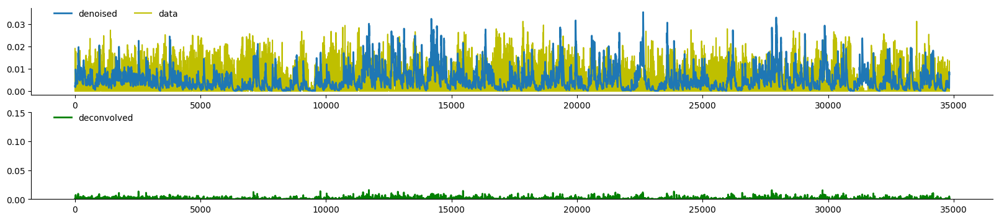

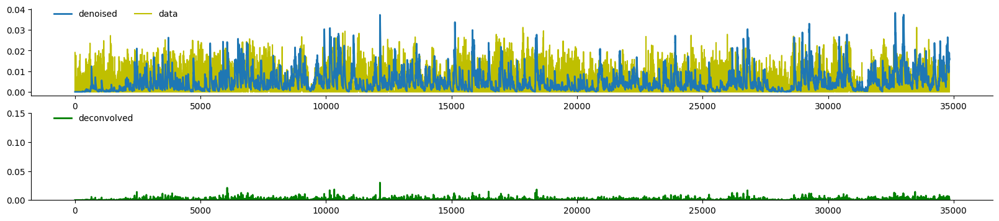

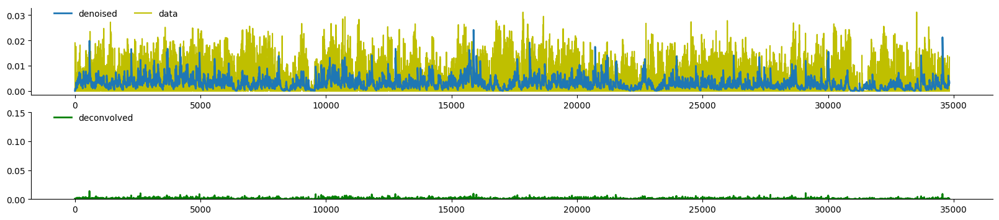

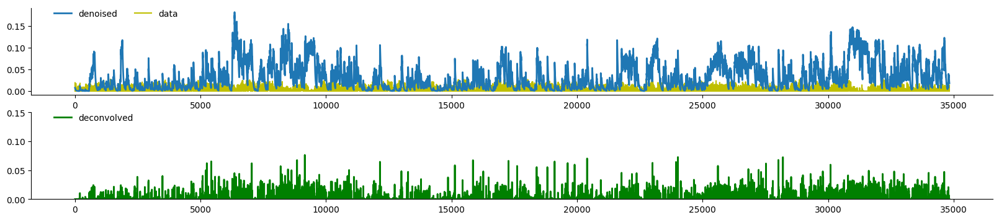

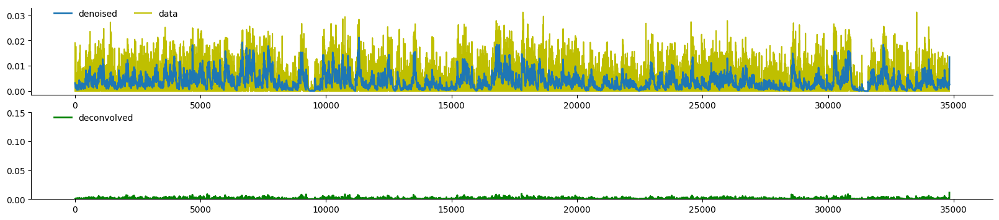

In [60]:
for cell_col in successful_cells:

    c = denoised_df[f"{cell_col}_calcium"].to_numpy()
    s = denoised_df[f"{cell_col}_deconv"].to_numpy()
    b = denoised_df[f"{cell_col}_baseline"].to_numpy()
    plot_trace()

In [53]:
deconvolved_traces_df  

,cell_0,cell_1,cell_2,cell_3,cell_6,cell_7,cell_9,cell_10,cell_12,cell_13,...,cell_211,cell_214,cell_215,cell_217,cell_218,cell_221,cell_222,cell_223,cell_224,cell_225
0,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000e+00,0.000000e+00,0.000000
1,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,3.897001e-02,0.020061,0.000000,0.000000e+00,0.000000e+00,...,8.183289e-03,0.000000e+00,0.002054,0.000000,1.964318e-04,0.000000e+00,0.00000,0.000000e+00,0.000000e+00,0.000000
2,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.00000,9.102517e-04,0.000000e+00,0.000000
3,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000e+00,0.000000e+00,0.000000
4,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000e+00,0.000000e+00,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34826,8.673617e-19,5.293956e-23,0.0,4.336809e-19,1.734723e-18,0.000000e+00,0.000715,0.000000,0.000000e+00,2.168404e-19,...,3.234331e-03,-1.734723e-18,0.000000,0.000000,-1.084202e-19,4.807154e-03,0.00000,-4.336809e-19,-3.469447e-18,0.000000
34827,0.000000e+00,0.000000e+00,0.0,-4.336809e-19,-1.734723e-18,-2.710505e-20,0.000874,0.000000,-2.168404e-19,2.168404e-19,...,0.000000e+00,0.000000e+00,0.000000,0.000000,1.084202e-19,0.000000e+00,0.00000,4.336809e-19,3.469447e-18,0.000000
34828,0.000000e+00,1.058791e-22,0.0,0.000000e+00,0.000000e+00,2.710505e-20,0.000000,0.000000,0.000000e+00,-4.336809e-19,...,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000e+00,-3.469447e-18,0.000104
34829,0.000000e+00,5.293956e-23,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,4.336809e-19,...,-1.734723e-18,1.734723e-18,0.000000,0.000000,-1.084202e-19,-8.673617e-19,0.00000,-4.336809e-19,0.000000e+00,0.000000


In [54]:
deconvolved_traces_df.to_csv(session_dir / f"{session_name}_cell_traces.csv", index=False)


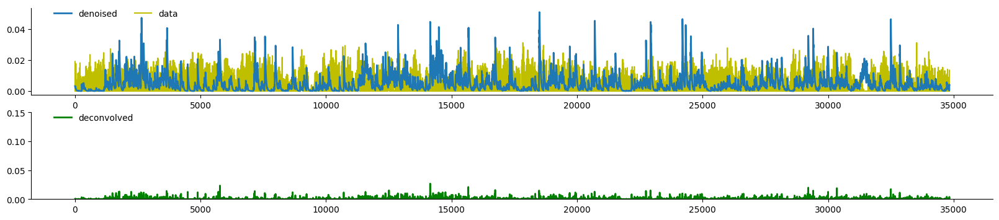

In [61]:

    c = denoised_df["cell_17_calcium"].to_numpy()
    s = denoised_df["cell_17_deconv"].to_numpy()
    b = denoised_df["cell_17_baseline"].to_numpy()
    plot_trace()